In [1]:
%load_ext autoreload
%autoreload 2

# Color Matching Demo
Replicating Pozzo lab's color matching demo on a Machine Agency Jubilee with the top-down camera tool.

In [2]:
# Import relevant packages

# We'll be using a pipette and camera tool for thi sdemo
from science_jubilee import Machine as Jub
from science_jubilee.labware.Labware import Labware, Well
from science_jubilee.tools import Pipette, Camera

# The bayesian optimazation code is provided in the 'bayesopt' folder
import sys
sys.path.append('./src/jubilee_pipette_bodemo/')
sys.path.append('../bayesopt')
import color_match
from color_match import BO_campaign
import jubilee_protocols
from bayesopt import acquisitions
from bayesopt import bayesian_optimizer

# These will be used to graph and analyze data
import ipywidgets as widgets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import sqrt, acos, asin, cos, sin
import copy
from IPython.display import display, clear_output
import json

## Machine Setup
Here we will configure our tools and labware to do our color matching.

In [3]:
# Connect to the machine
jubilee = Jub.Machine(address='jubilee.local')

In [4]:
# Drop the bed down so that we can insert labware
jubilee.move_to(z = 150)

In [5]:
# We'll be using a 6 well plate to hold our colors;
# a 96 well plate to mix our samples;
# a tiprack for our pipette;
# and a petri dish to throw away used pipette tips
deck = jubilee.load_deck('lab_automation_deck_MAfeb.json')
tiprack = jubilee.load_labware('opentrons_96_tiprack_300ul.json', 0)
trash = jubilee.load_labware('agilent_1_reservoir_290ml.json', 3)
samples = jubilee.load_labware('corning_96_wellplate_360ul_flat.json', 4)
stocks = jubilee.load_labware('scienfocus_6_wellplate_15900ul.json', 5)

In [ ]:
# Specify the well of each of our stocks
red_stock = stocks["A3"]
blue_stock = stocks["A2"]
yellow_stock = stocks["A1"]

trash_well = trash[0]

In [6]:
# Load our pipette
# The pipette is tool 1 on our machine
P300 = Pipette.Pipette.from_config(1, 'Pipette', 'P300_config.json')
jubilee.load_tool(P300)
P300.add_tiprack(tiprack)

In [7]:
# Load our camera
camera = Camera.Camera(3, 'Camera')
jubilee.load_tool(camera)

## Color picking

In [8]:
# Pick a color to match!
a = widgets.ColorPicker(
    concise=False,
    description='Pick a color',
    value='blue',
    disabled=False
)

In [23]:
a

ColorPicker(value='#ff0019', description='Pick a color')

ERROR! Session/line number was not unique in database. History logging moved to new session 520


In [10]:
# hexcode = a.value

In [24]:
hexcode = a.value
target_rgb = tuple(int(hexcode.lstrip('#')[i:i+2], 16) for i in (0,2,4))
target_color = color_match.normalize_color(target_rgb)

In [25]:
target_color

[1.0, 0.0, 0.09803921568627451]

## Get initial samples
Here we gather $n$ initial random samples. Note that an example with 6 samples has already be gathered; if you don't want to spend time gathering new random samples, you can skip to the next section to run color matching.

In [14]:
sample_space = color_match.get_constrained_points(101) # add function explanation

In [15]:
n_init_points = 6 # How many random samples do you want to collect?
sampled_indices = np.random.randint(0, len(sample_space), size = n_init_points)
sampled_points = sample_space[sampled_indices]

Creating sample 0
Calculated RYB volumes, in uL:  [72.5, 122.5, 55.0]


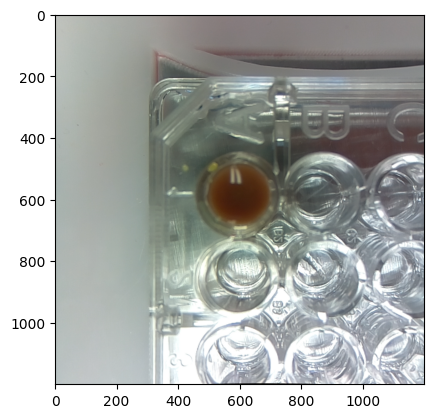

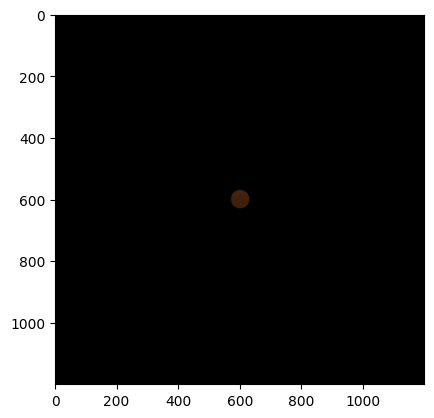

Creating sample 1
Calculated RYB volumes, in uL:  [92.5, 70.0, 87.50000000000001]


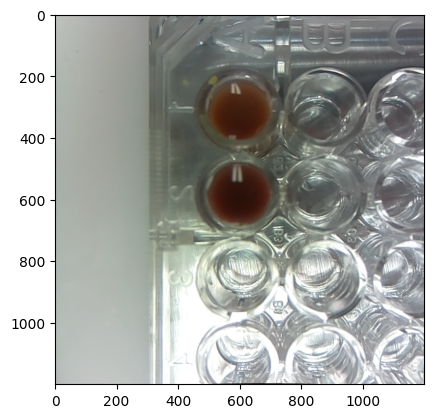

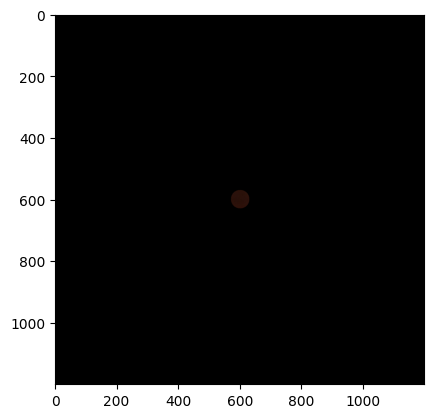

Creating sample 2
Calculated RYB volumes, in uL:  [82.5, 155.0, 12.5]


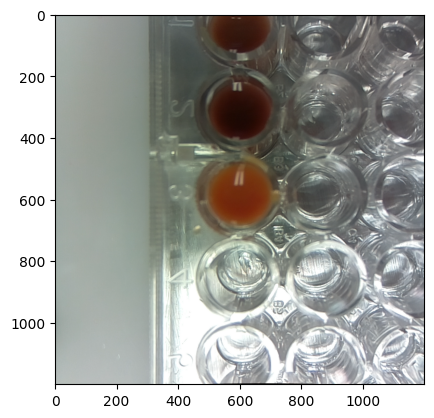

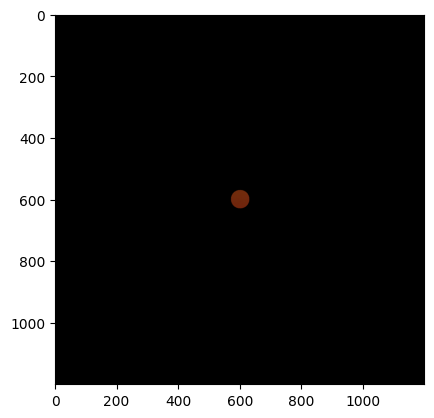

Creating sample 3
Calculated RYB volumes, in uL:  [135.0, 72.5, 42.5]


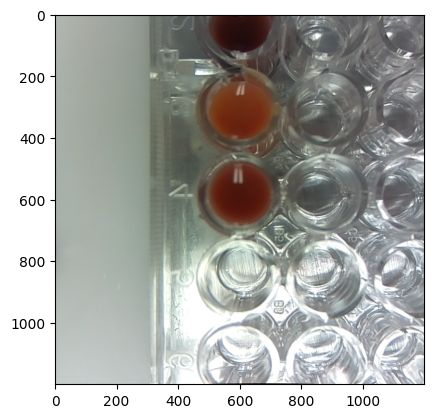

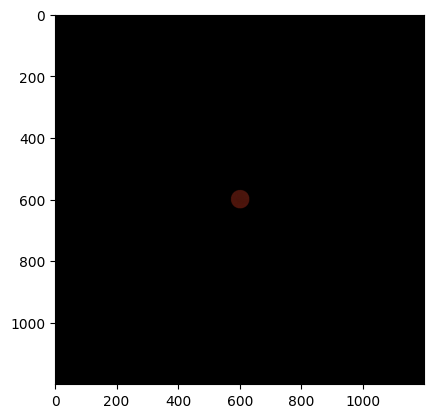

Creating sample 4
Calculated RYB volumes, in uL:  [7.5, 107.5, 135.0]


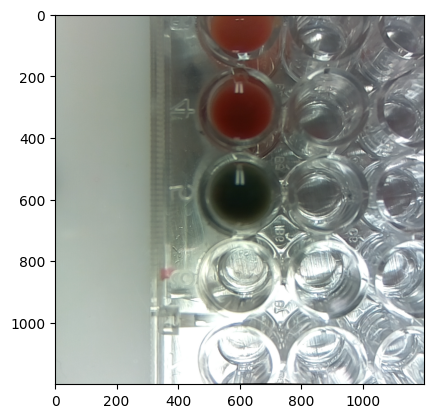

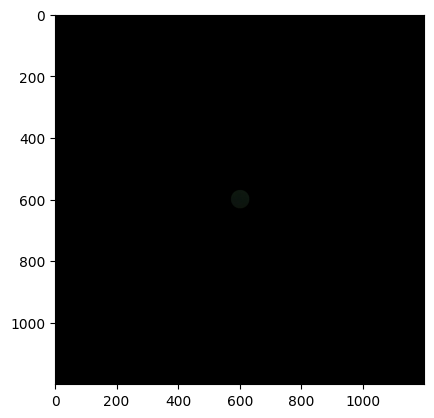

Creating sample 5
Calculated RYB volumes, in uL:  [0.0, 250.0, 0.0]


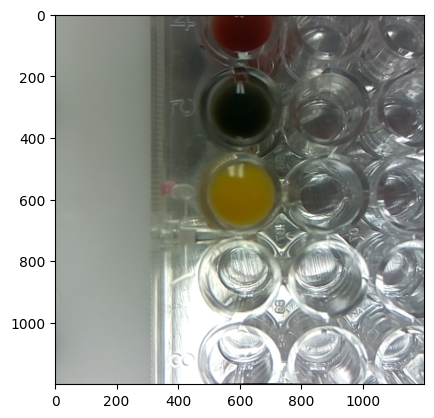

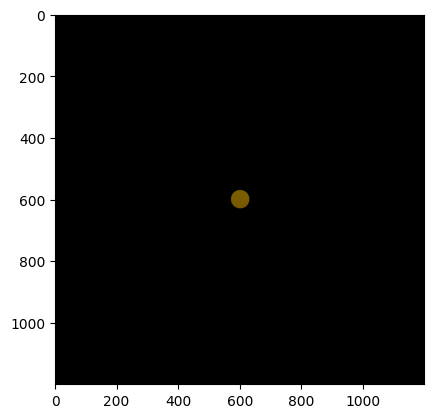

In [16]:
# This cell will move the machine!
# The machine will mix random ratios of colors in wells and take images of each
# Images will be displayed as we go along.
%matplotlib inline
rgb_vals = []
for i in range(len(sampled_points)):
    point = sampled_points[i,:]
    well = samples[i]
    print(f'Creating sample {i}')
    
    RGB = jubilee_protocols.sample_point(jubilee, P300, camera, point, 250, well, red_stock, yellow_stock, blue_stock, trash_well)
    rgb_vals.append(RGB)

In [17]:
# Save the data
init_data = []
for i in range(len(sampled_points)):
    data = {}
    data['sample_id'] = str(i)
    data['RYB_point'] = list(sampled_points[i])
    data['RGB_measured'] = rgb_vals[i][0]

    init_data.append(data)

In [18]:
with open('initial_data_random_6.jsonl', 'wt') as f:
    for entry in init_data:
        f.write(json.dumps(entry) + '\n')

# Color Matching!
The cells below will run a bayesian optimization campaign to make target color 

### Load initial data and calculate loss value for target color 
Note that we can go through and annotate/explain these functions, if they are to be black-boxed-ish to our participants

In [26]:
init_data = []

with open('initial_data_random_6.jsonl', 'rt') as f:
    for line in f:
        init_data.append(json.loads(line))

In [27]:
init_X = np.zeros((len(init_data),3))
init_y = np.zeros(len(init_data))

for i, entry in enumerate(init_data):
    init_X[i,:] = entry['RYB_point']
    init_y[i] = color_match.color_loss_calculation(target_color, color_match.normalize_color(entry['RGB_measured']))

### Select acquisition function

In [28]:
acquisition_function = acquisitions.optimize_EI
acq_kwargs = {'xi':0.3}

In [29]:
initial_data = (init_X, init_y)
number_of_iterations = 15 # How many iterations do you want to run? The more you run, the better chance of color matching!

Starting iteration 0
Dispensing into well Well(name='D1', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=34.980000000000004, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [1. 0. 0.]
Calculated RYB volumes, in uL:  [250.0, 0.0, 0.0]


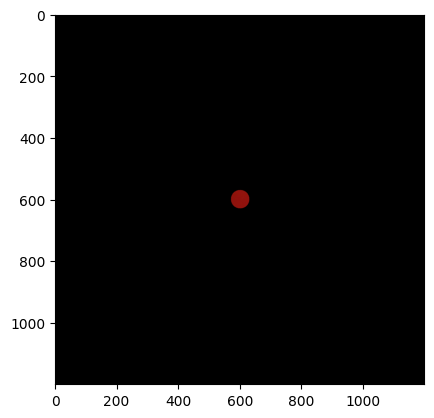

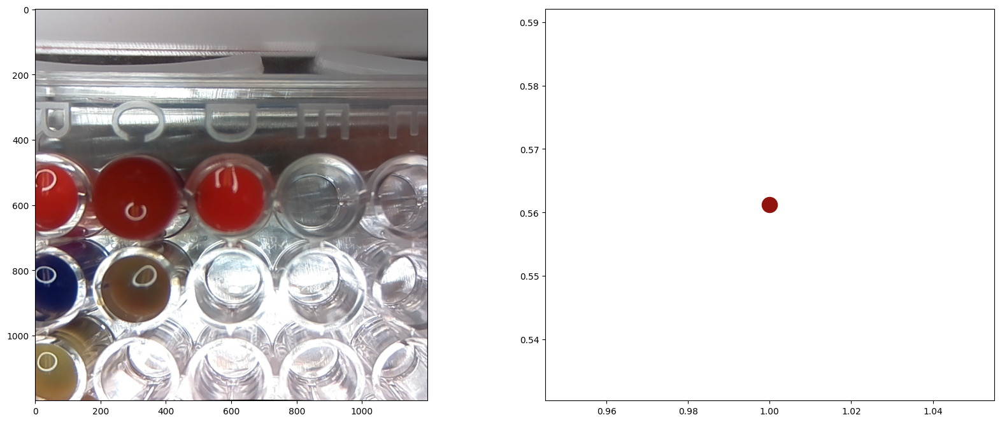

Starting iteration 1
Dispensing into well Well(name='D2', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=43.980000000000004, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0. 0. 1.]
Calculated RYB volumes, in uL:  [0.0, 0.0, 250.0]


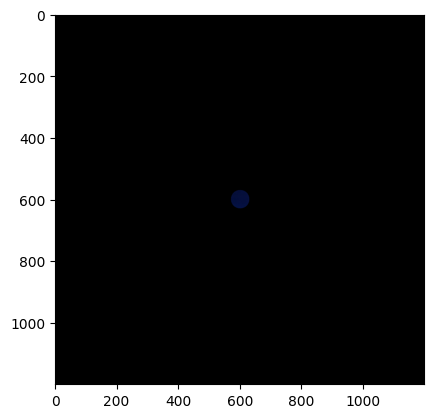

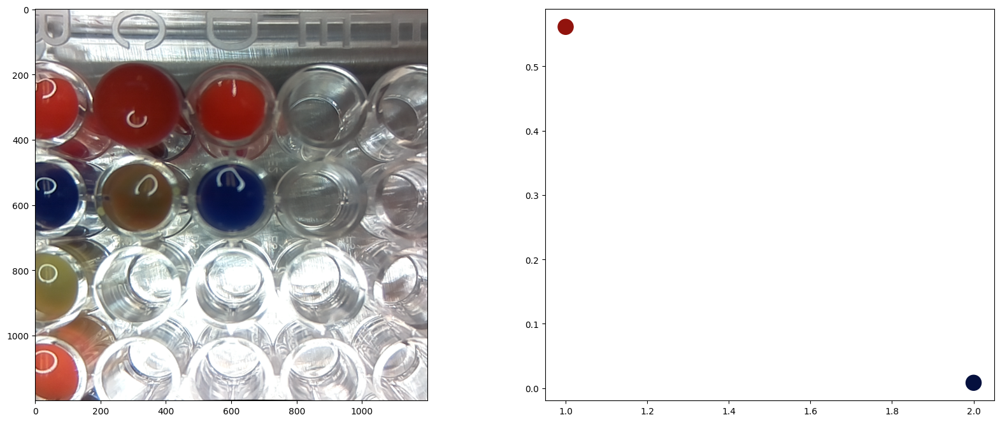

Starting iteration 2
Dispensing into well Well(name='D3', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=52.980000000000004, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.83 0.17 0.  ]
Calculated RYB volumes, in uL:  [207.50000000000003, 42.5, 0.0]


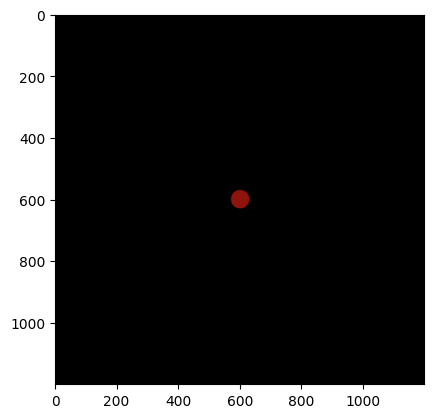

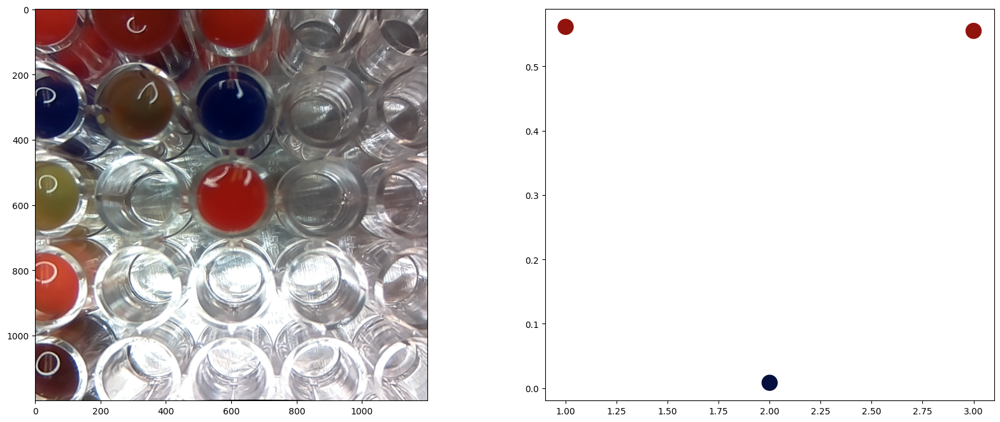

Starting iteration 3
Dispensing into well Well(name='D4', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=61.980000000000004, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.83 0.   0.17]
Calculated RYB volumes, in uL:  [207.50000000000003, 0.0, 42.5]


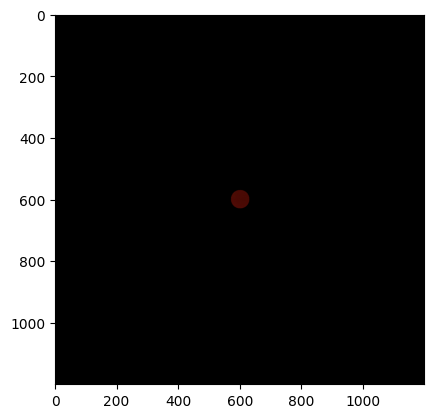

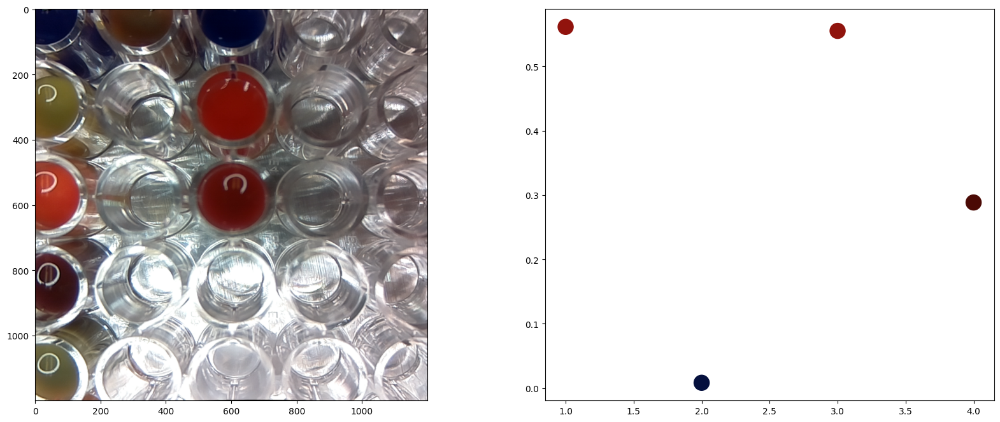

Starting iteration 4
Dispensing into well Well(name='D5', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=70.98, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.65 0.35 0.  ]
Calculated RYB volumes, in uL:  [162.5, 87.50000000000001, 0.0]


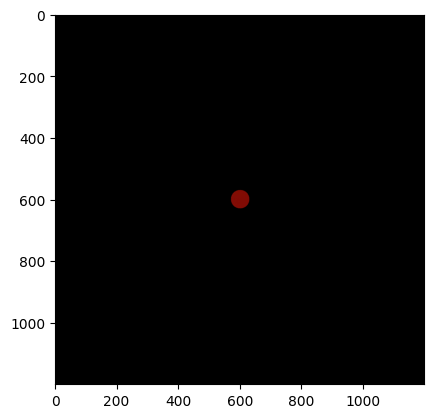

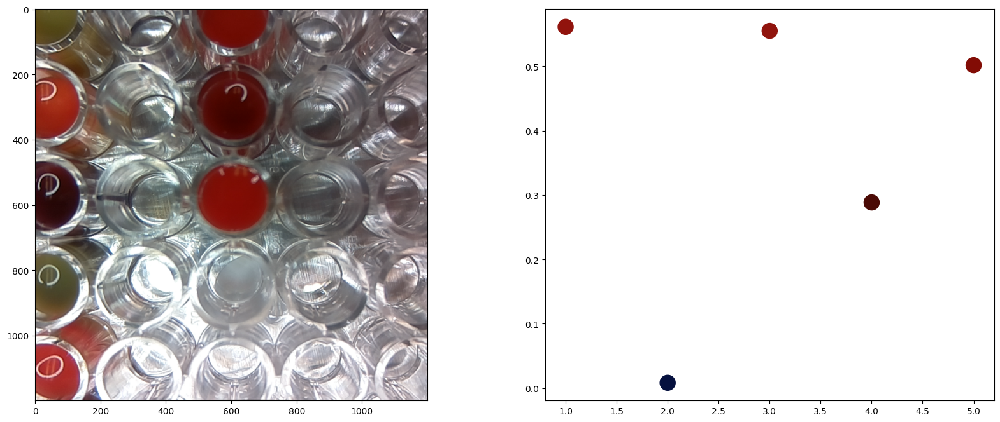

Starting iteration 5
Dispensing into well Well(name='D6', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=79.98, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.5 0.5 0. ]
Calculated RYB volumes, in uL:  [125.0, 125.0, 0.0]


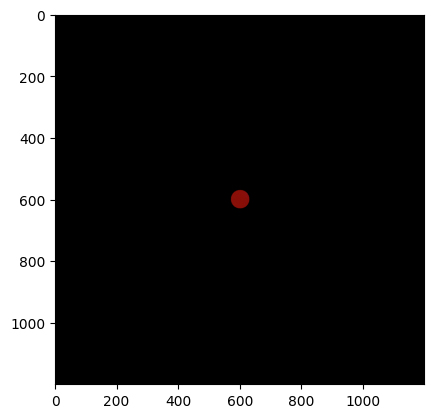

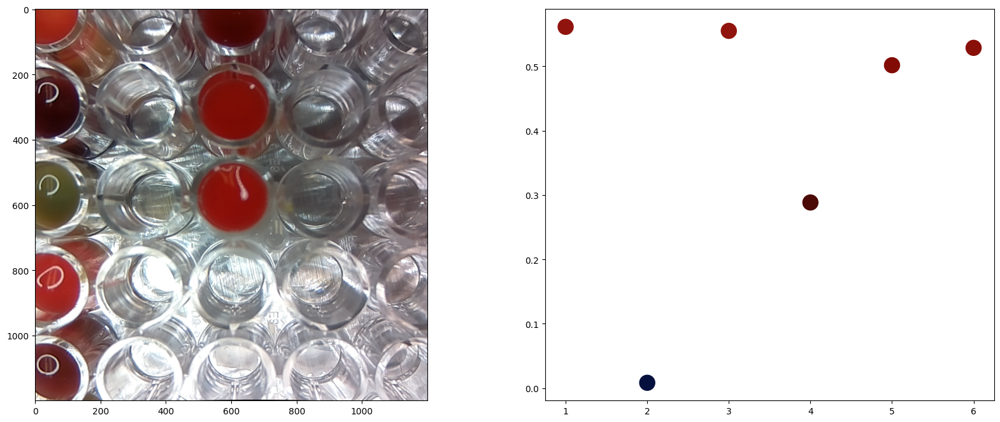

Starting iteration 6
Dispensing into well Well(name='D7', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=88.97999999999999, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.2 0.8 0. ]
Calculated RYB volumes, in uL:  [50.0, 200.0, 0.0]


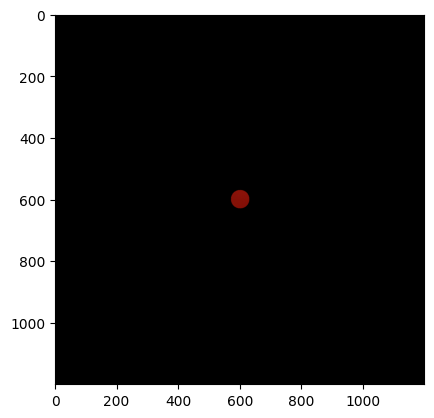

/home/pi/science_jubilee/.venv/lib/python3.7/site-packages/sklearn/gaussian_process/_gpr.py:610: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


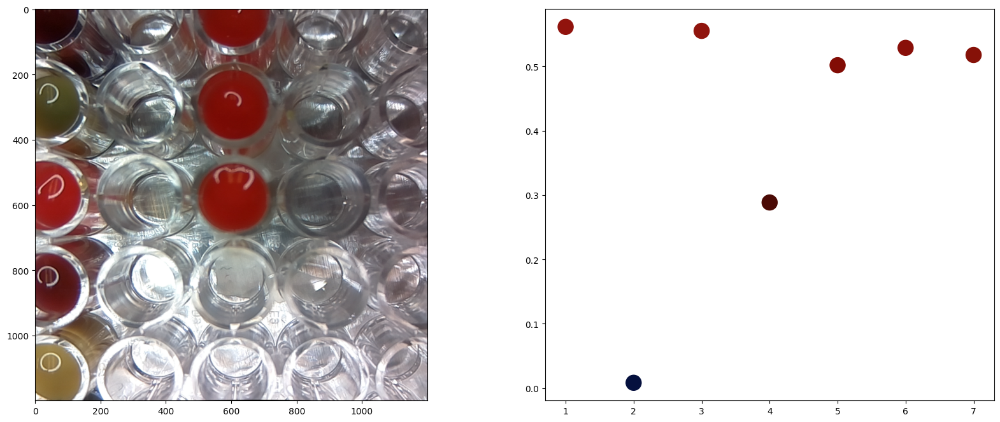

Starting iteration 7
Dispensing into well Well(name='D8', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=97.97999999999999, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.92 0.08 0.  ]
Calculated RYB volumes, in uL:  [230.0, 20.0, 0.0]


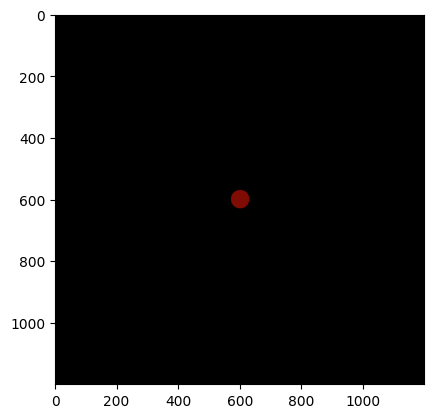

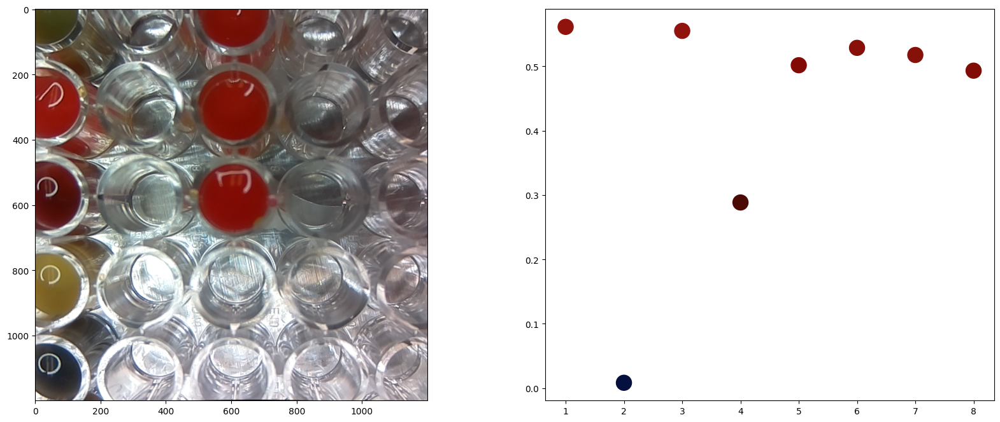

Starting iteration 8
Dispensing into well Well(name='D9', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=106.97999999999999, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.75 0.25 0.  ]
Calculated RYB volumes, in uL:  [187.5, 62.5, 0.0]


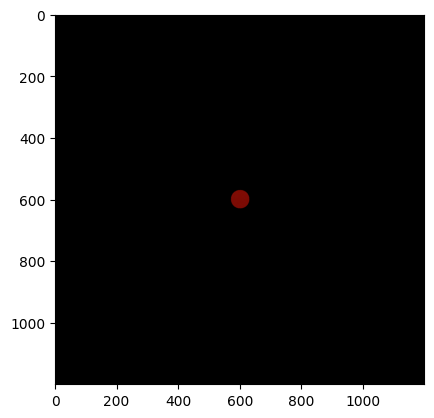

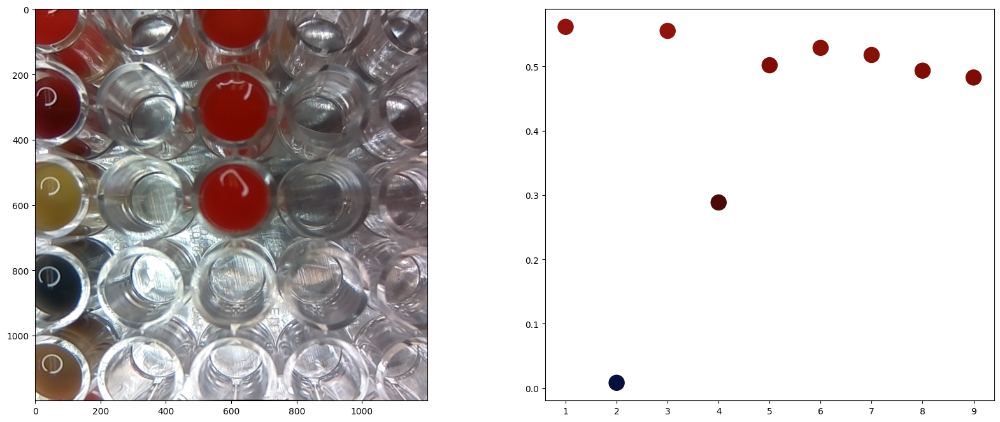

Starting iteration 9
Dispensing into well Well(name='D10', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=115.97999999999999, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.  0.8 0.2]
Calculated RYB volumes, in uL:  [0.0, 200.0, 50.0]


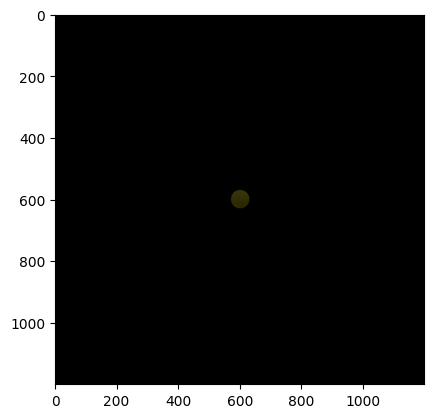

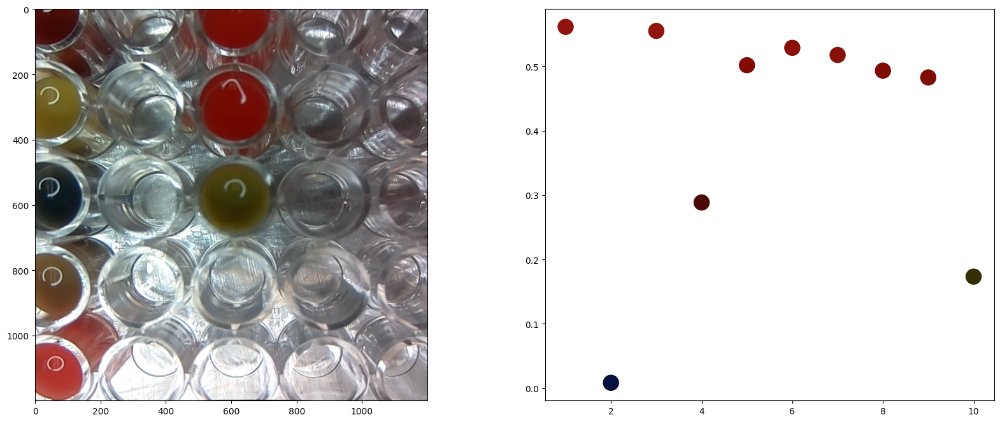

Starting iteration 10
Dispensing into well Well(name='D11', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=124.97999999999999, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.28 0.72 0.  ]
Calculated RYB volumes, in uL:  [70.0, 180.0, 0.0]


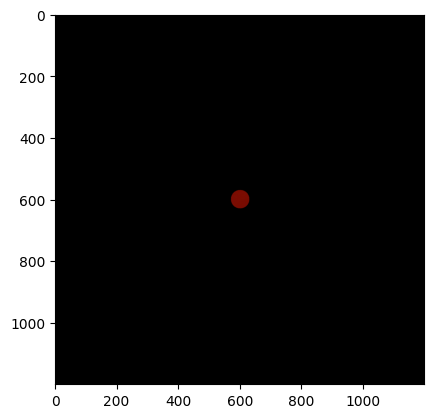

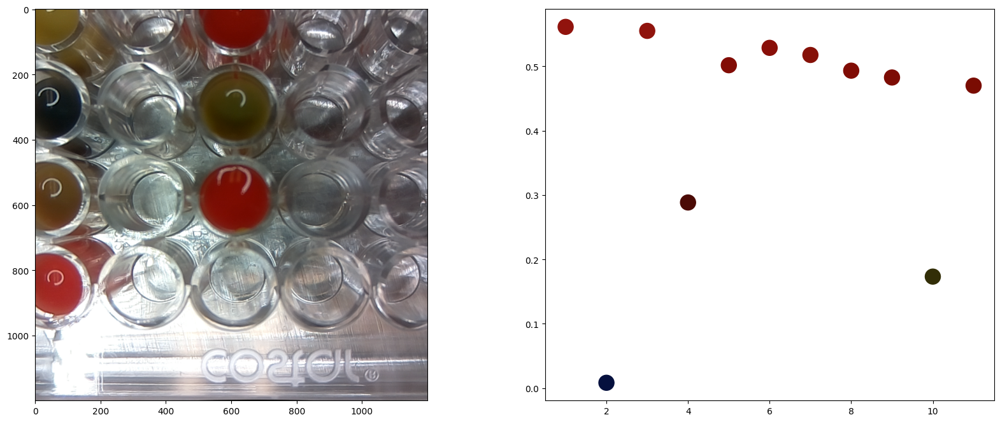

Starting iteration 11
Dispensing into well Well(name='D12', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=133.98, y=246.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.57 0.43 0.  ]
Calculated RYB volumes, in uL:  [142.50000000000003, 107.5, 0.0]


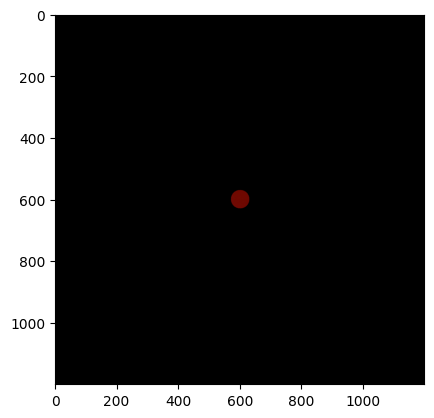

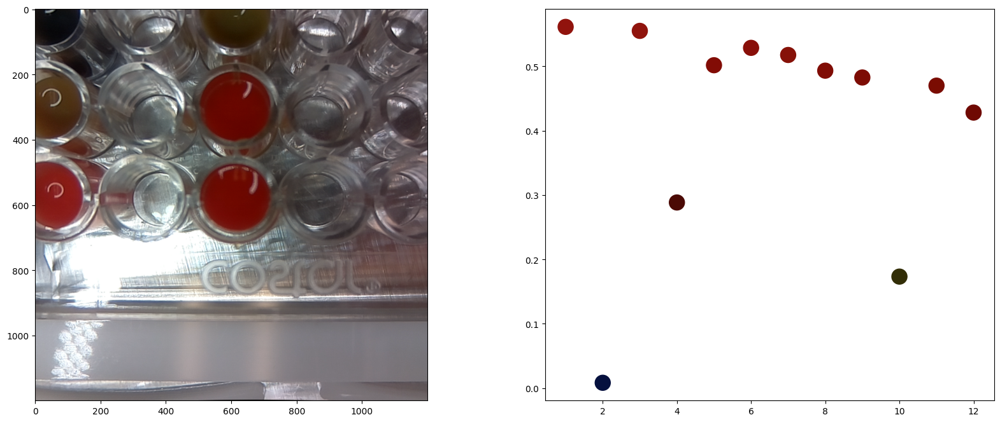

Starting iteration 12
Dispensing into well Well(name='E1', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=34.980000000000004, y=237.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.53 0.   0.47]
Calculated RYB volumes, in uL:  [132.5, 0.0, 117.50000000000001]


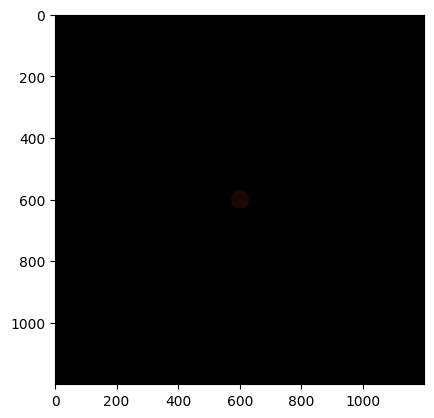

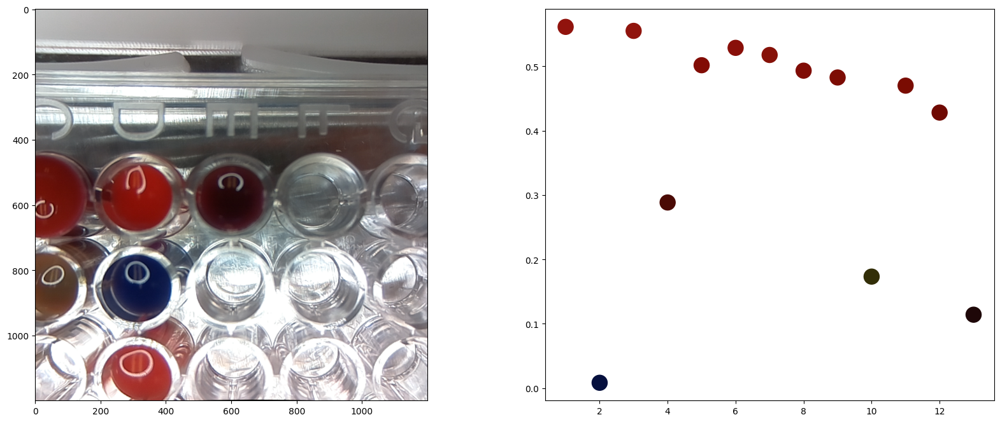

Starting iteration 13
Dispensing into well Well(name='E2', depth=10.67, totalLiquidVolume=360, shape='circular', diameter=6.86, xDimension=None, yDimension=None, x=43.980000000000004, y=237.64000000000001, z=3.55, offset=[20.6, 199.4], slot=4)
RYB values tested: [0.42 0.58 0.  ]
Calculated RYB volumes, in uL:  [105.0, 145.0, 0.0]


KeyboardInterrupt: 

In [31]:
# This cell will run the machine!
# Will will mix colors and image wells, using the data to inform the next iteration
# Images & plots will show as we go
%matplotlib inline
ryb_sampled, rgb_measured, images, scores, bo_obj = BO_campaign(initial_data, acquisition_function, acq_kwargs, number_of_iterations, target_color, jubilee, P300, camera, 250, red_stock, yellow_stock, blue_stock, samples, trash_well, start_well = 36)

In [ ]:
## Misc, to be deleted

In [ ]:
from IPython.display import display, clear_output
display(fig)

In [ ]:
jubilee.pickup_tool(camera)

In [ ]:
tf = camera.get_well_image(well=samples["A8"])

In [ ]:
plt.imshow(tf)

In [ ]:
import image_processing as img
RGB = img.process_image(tf)

In [ ]:
RGB